# Spectral Analysis

import libraries

In [ ]:
import numpy as np
import warnings
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from regions import Regions
import pandas as pd
import plotly.graph_objects as go

warnings.filterwarnings("ignore", category=UserWarning, append=True)

regions is an in-development coordinated package of Astropy for region handling.

The Regions package provides classes to represent:

    Regions defined using pixel coordinates (e.g., CirclePixelRegion)
    Regions defined using celestial coordinates, but still in an Euclidean geometry (e.g., CircleSkyRegion)
    To transform between sky and pixel regions, a world coordinate system object (e.g., astropy.wcs.WCS) is needed.

Regions also provides a unified interface for reading, writing, parsing, and serializing regions data in different formats, including the DS9 Region Format, CRTF (CASA Region Text Format), and FITS Region Binary Table format.

You can read more about it in here:

https://astropy-regions.readthedocs.io/en/stable/shapes.html

In [ ]:
z = 0.016268
reg_path = "data/region_file"
regions = Regions.read(reg_path, format='ds9')

File Group Dictionary

In [ ]:
channels = {
    "ch1": [
        './data/jw01328-c1006_t014_miri_ch1-short_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch1-medium_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch1-long_s3d.fits'
    ],
    "ch2": [
        './data/jw01328-c1006_t014_miri_ch2-short_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch2-medium_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch2-long_s3d.fits'
    ],
    "ch3": [
        './data/jw01328-c1006_t014_miri_ch3-short_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch3-medium_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch3-long_s3d.fits'
    ],
    "ch4": [
        './data/jw01328-c1006_t014_miri_ch4-short_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch4-medium_s3d.fits',
        './data/jw01328-c1006_t014_miri_ch4-long_s3d.fits'
    ]
}

Now we have defined the redshift from NED, made a region file from DS9 and made a list of all the files to iterate over.

We can proceed further and extract the spectra from each of the file and plot the final spectrum from it.

In [ ]:
def process_region(region_index, file_group, label):
    region = regions[region_index]
    spectrum_all = []
    spectrum_all_err = []
    wavelength_all = []

    for file_path in file_group:
        spectrum = []
        spectrum_err = []

        with fits.open(file_path) as hdul:
            data = hdul[1].data
            data[data < 0] = np.nan
            data_err = hdul[2].data
            header = hdul[1].header
            wcs = WCS(header)
            mask = region.to_pixel(wcs.celestial).to_mask()
            num_channels, ny, nx = data.shape

            for i in range(num_channels):
                masked_data = np.array(mask.multiply(data[i, :, :]), dtype=float)
                masked_data_err = np.array(mask.multiply(data_err[i, :, :]), dtype=float)
                avg_intensity = np.nanmean(masked_data)
                avg_intensity_err = np.sqrt(np.nanmean(masked_data_err**2))
                if np.isnan(avg_intensity): avg_intensity = 0
                if np.isnan(avg_intensity_err): avg_intensity_err = 0
                spectrum.append(avg_intensity)
                spectrum_err.append(avg_intensity_err)

            crval3 = header['CRVAL3']
            cdelt3 = header['CDELT3']
            crpix3 = header['CRPIX3']
            wavelength = (np.arange(num_channels) - (crpix3 - 1)) * cdelt3 + crval3
            wavelength /= (1 + z)

            wavelength_all.extend(wavelength)
            spectrum_all.extend(spectrum)
            spectrum_all_err.extend(spectrum_err)

    df = pd.DataFrame({
        'Wavelength_microns': wavelength_all,
        'Intensity_MJy_sr': spectrum_all,
        'Uncertainty': spectrum_all_err
    })
    df.to_csv(f'extracted_spectrum_{label}.csv', index=False)

    plt.figure(figsize=(15, 8))
    plt.errorbar(wavelength_all, spectrum_all, yerr=spectrum_all_err, color='blue', ecolor='black')
    plt.xlabel('Wavelength (microns)')
    plt.ylabel('Average Intensity (MJy/sr)')
    plt.grid(True)
    plt.title(f'NGC 7469 Spectrum - {label}')
    plt.savefig(f'spectrum_plot_{label}.png', dpi=300)
    plt.show()

    fig = go.Figure(layout=dict(width=800, height=500, template='plotly_white'))
    fig.add_trace(go.Scatter(
        x=wavelength_all,
        y=spectrum_all,
        mode='lines',
        line=dict(color='#1f77b4', width=1.5),
        name='Spectrum'
    ))

    spectrum_all = np.array(spectrum_all)
    spectrum_all_err = np.array(spectrum_all_err)
    wavelength_all = np.array(wavelength_all)

    fig.add_trace(go.Scatter(
        x=np.concatenate([wavelength_all, wavelength_all[::-1]]),
        y=np.concatenate([spectrum_all + spectrum_all_err, (spectrum_all - spectrum_all_err)[::-1]]),
        fill='toself',
        fillcolor='rgba(31, 119, 180, 0.2)',
        line=dict(color='rgba(255,255,255,0)'),
        hoverinfo='skip',
        name='Uncertainty'
    ))

    features = {
        'PAHs': {'PAH 7.7': 7.7, 'PAH 8.6': 8.6, 'PAH 11.3': 11.3},
        'Neon': {'[Ne VI]': 7.65},
        'Other': {'[Ar III]': 8.991, '[S IV]': 10.51},
        'H₂': {'S(3)': 9.66, 'S(4)': 8.03}
    }

    colors = {
        'PAHs': '#FF7F0E',
        'Neon': '#D62728',
        'Other': '#9467BD',
        'H₂': '#8C564B'
    }

    for category, lines in features.items():
        for name, wl in lines.items():
            fig.add_vline(
                x=wl,
                line=dict(color=colors[category], width=1.5, dash='dot'),
                annotation=dict(text=name, yanchor='bottom', font=dict(size=10, color=colors[category]), yshift=10)
            )

    for wl in [7.7, 8.6, 11.3]:
        fig.add_vrect(x0=wl-0.15, x1=wl+0.15, fillcolor=colors['PAHs'], opacity=0.1, line_width=0)

    fig.update_layout(
        title=f'<b>NGC 7469 JWST/MIRI Spectrum - {label}</b>',
        xaxis_title='<b>Wavelength (μm)</b>',
        yaxis_title='<b>Intensity (MJy/sr)</b>',
        hovermode='x unified',
        margin=dict(l=50, r=50, b=50, t=80),
    )

    fig.write_html(f'interactive_spectrum_{label}.html')
    fig.show()


Run for Region 0 and Region 1, Per Channel

Set DATE-AVG to '2022-07-04T03:54:53.948' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:02.328' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445736.634 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:31.595' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:33.047' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283459 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461184.323 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.737' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.654' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476718.877 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


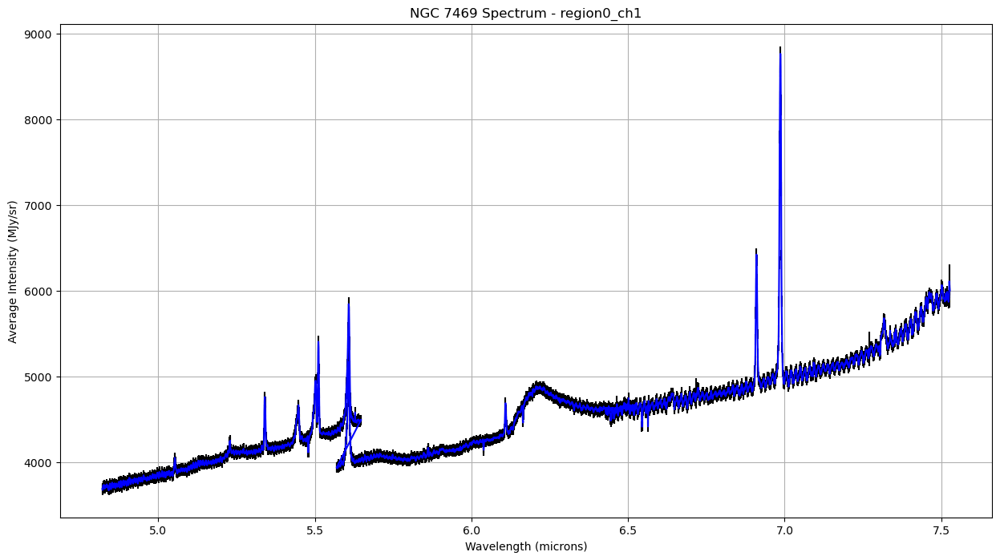

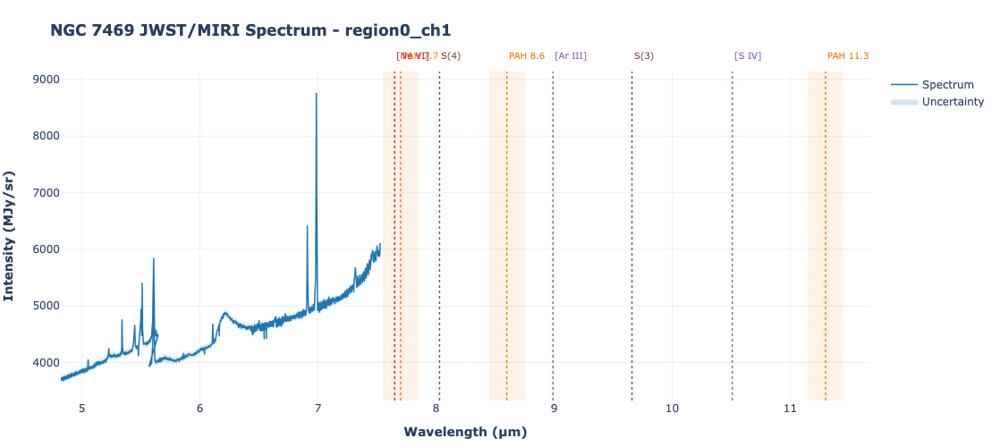

Set DATE-AVG to '2022-07-04T03:54:53.948' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:02.328' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445736.634 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:31.595' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:33.047' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283459 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461184.323 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.737' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.654' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476718.877 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


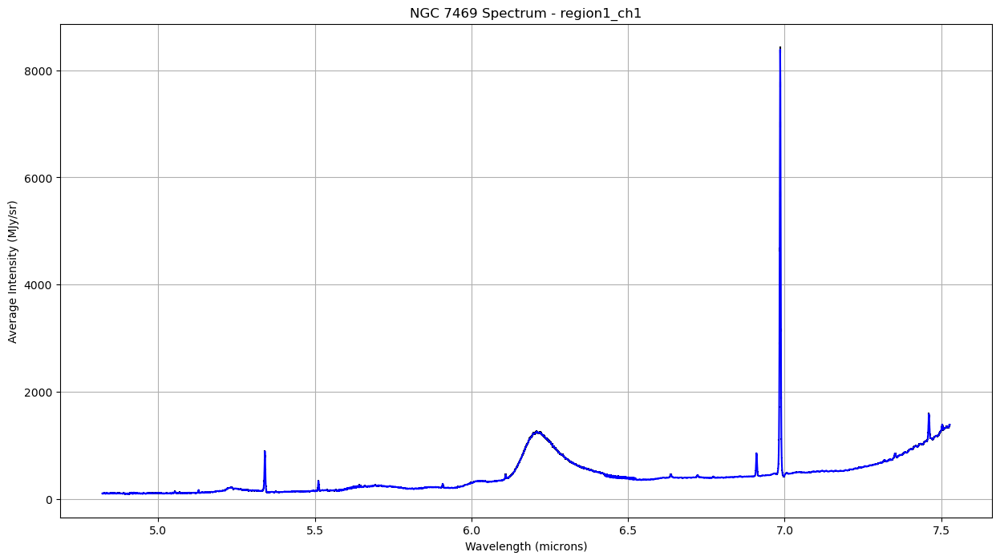

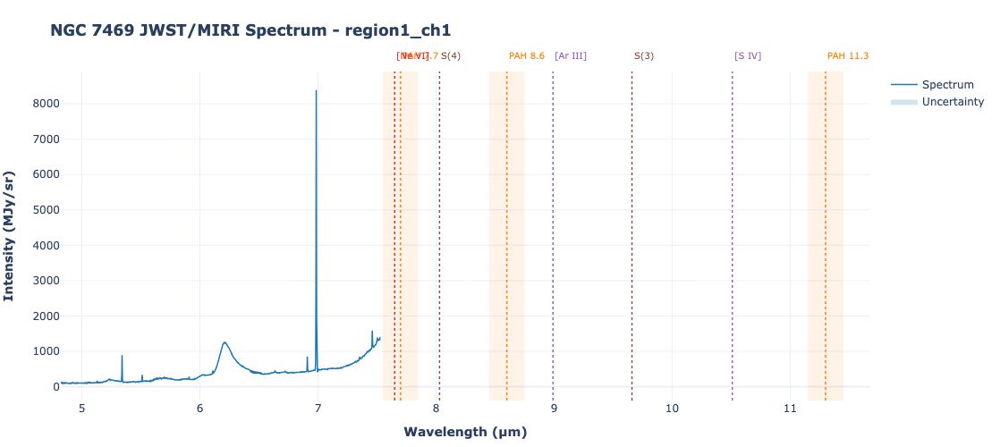

Set DATE-AVG to '2022-07-04T03:54:53.948' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:02.328' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445736.634 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:31.595' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:33.047' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283459 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461184.323 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.737' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.654' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476718.877 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


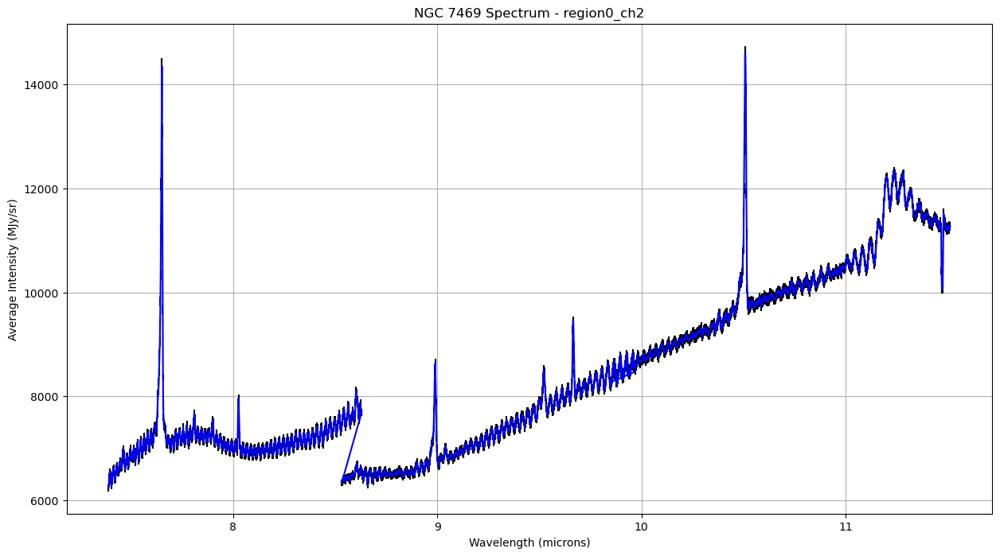

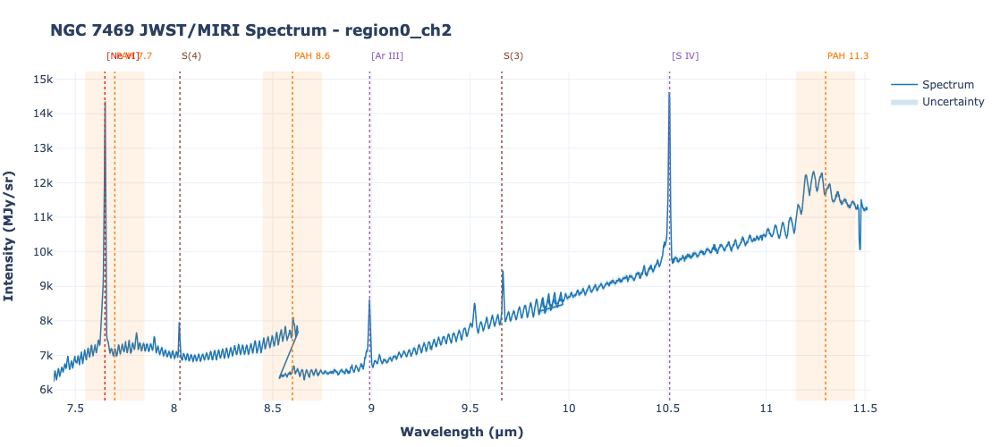

Set DATE-AVG to '2022-07-04T03:54:53.948' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:02.328' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445736.634 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:31.595' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:33.047' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283459 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461184.323 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.737' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.654' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476718.877 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


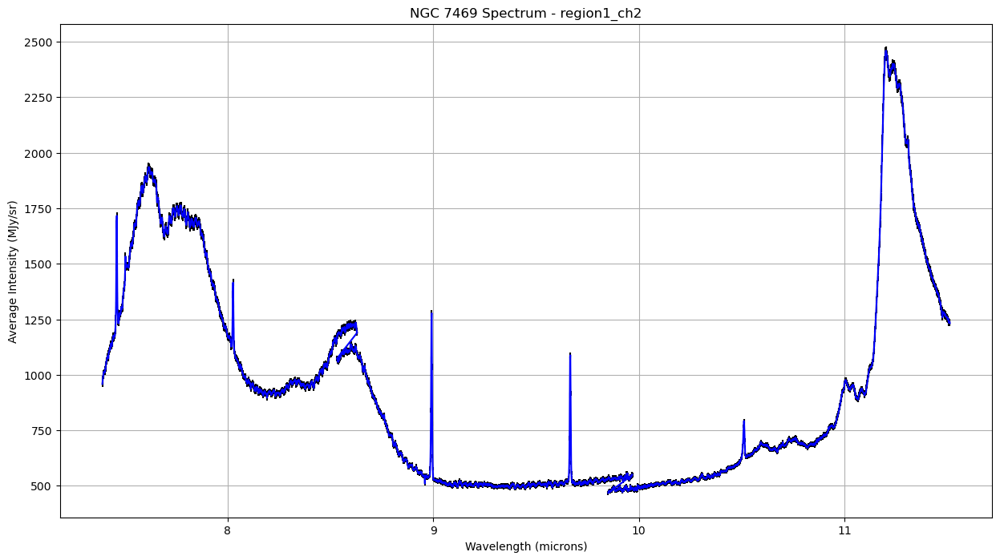

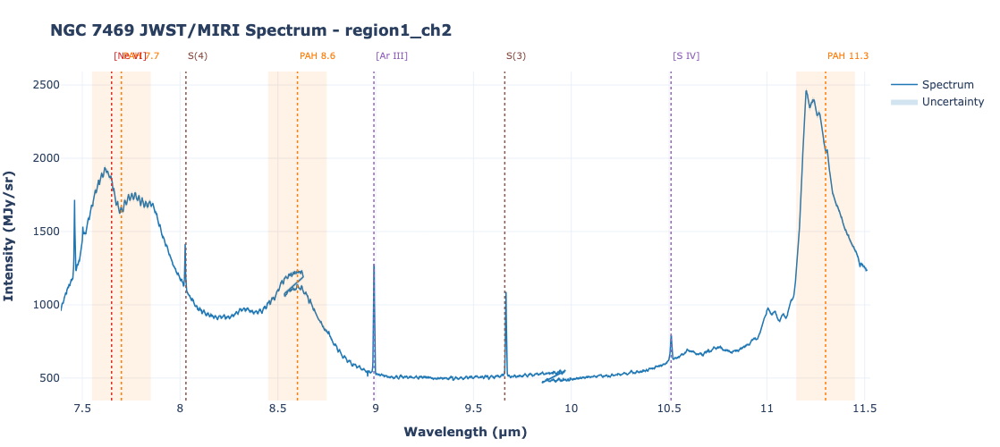

Set DATE-AVG to '2022-07-04T03:54:53.308' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:01.688' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445726.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:30.971' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:32.407' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283458 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461174.508 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.114' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.014' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476710.042 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


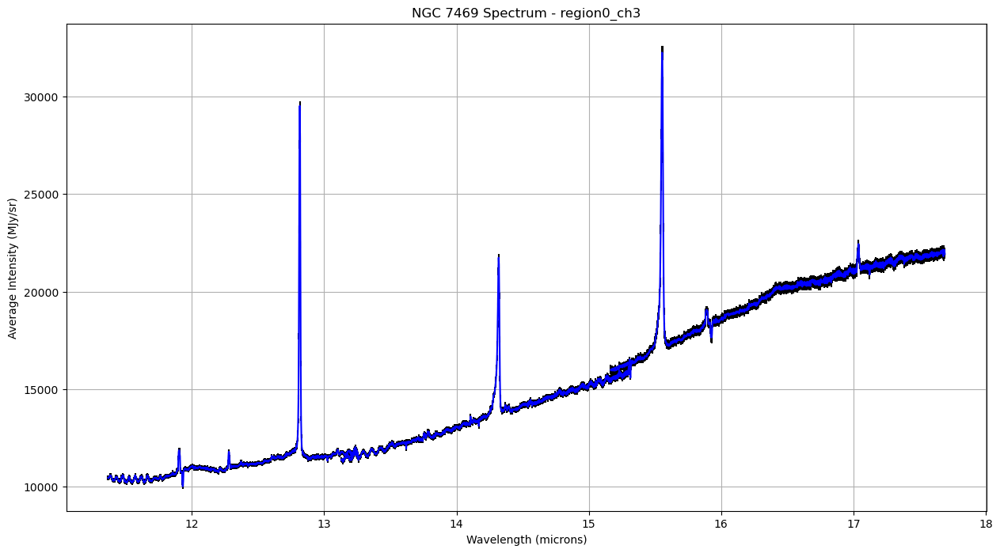

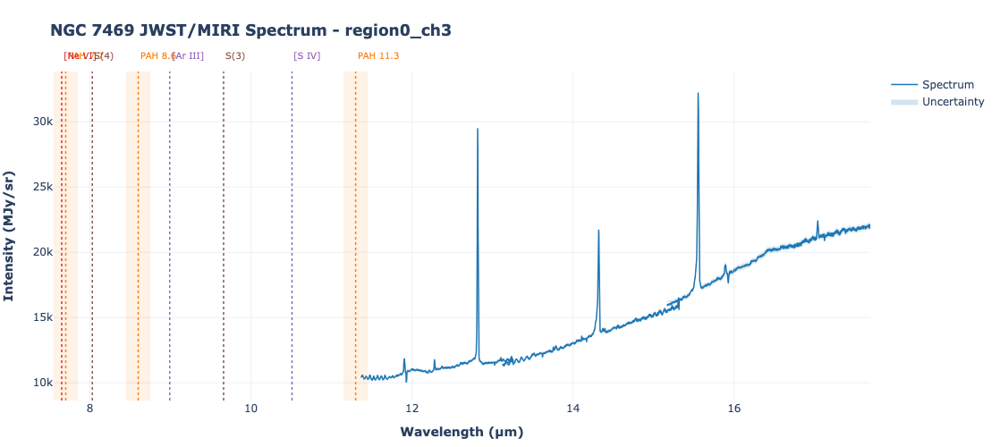

Set DATE-AVG to '2022-07-04T03:54:53.308' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:01.688' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445726.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:30.971' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:32.407' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283458 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461174.508 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.114' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.014' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476710.042 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


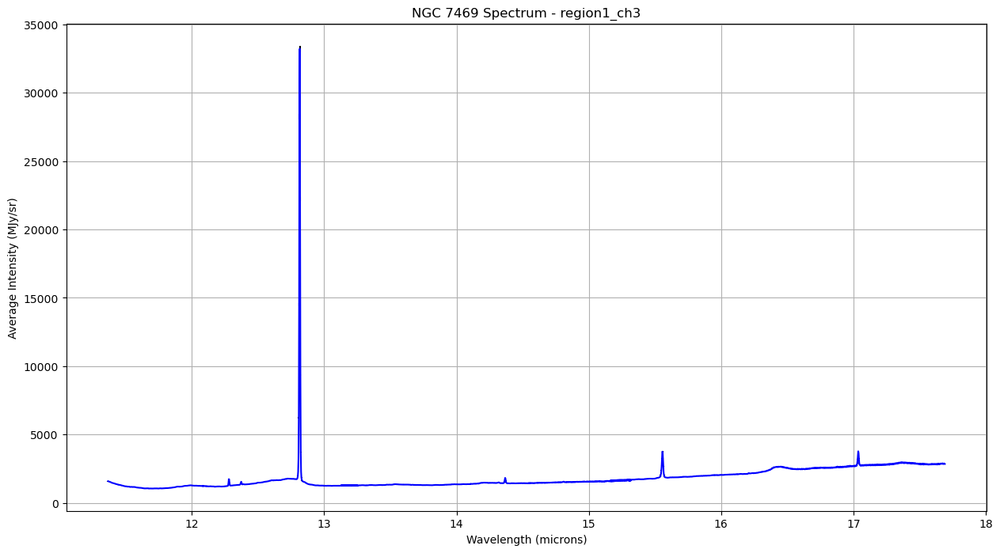

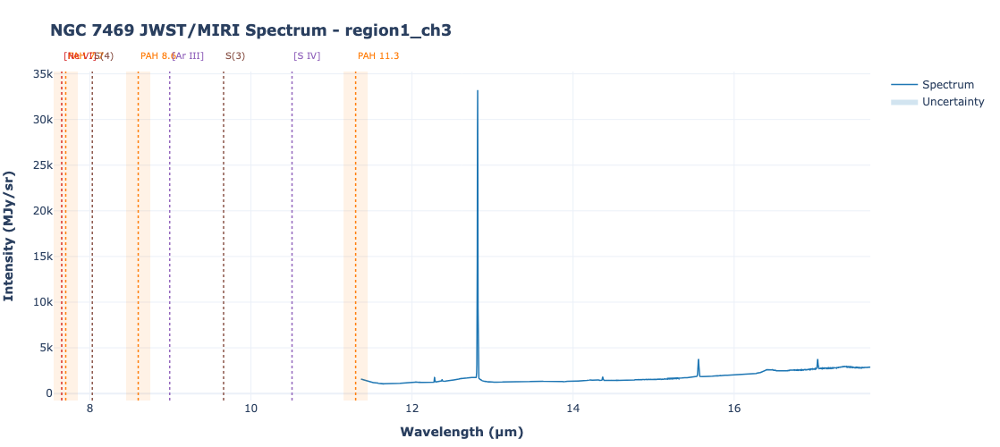

Set DATE-AVG to '2022-07-04T03:54:53.308' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:01.688' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445726.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:30.971' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:32.407' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283458 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461174.508 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.114' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.014' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476710.042 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


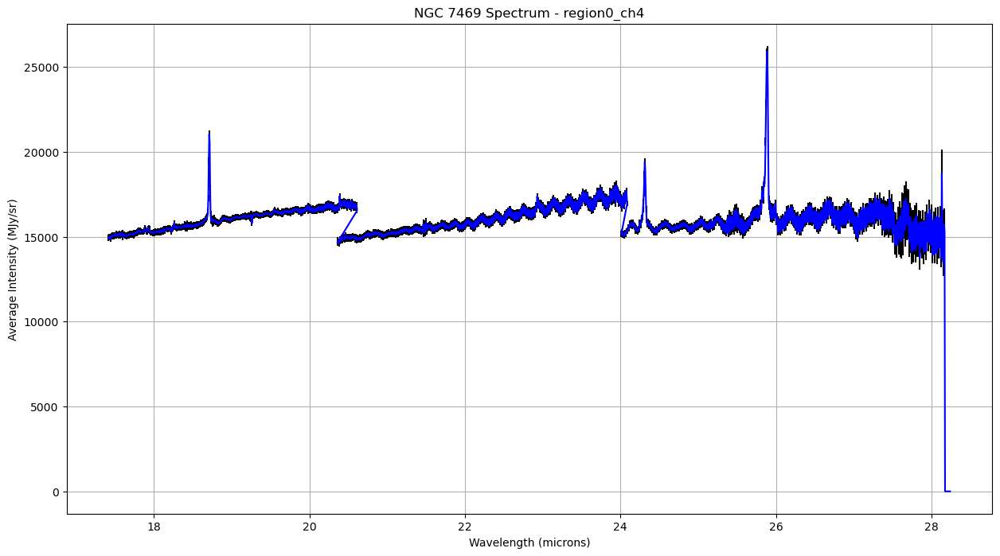

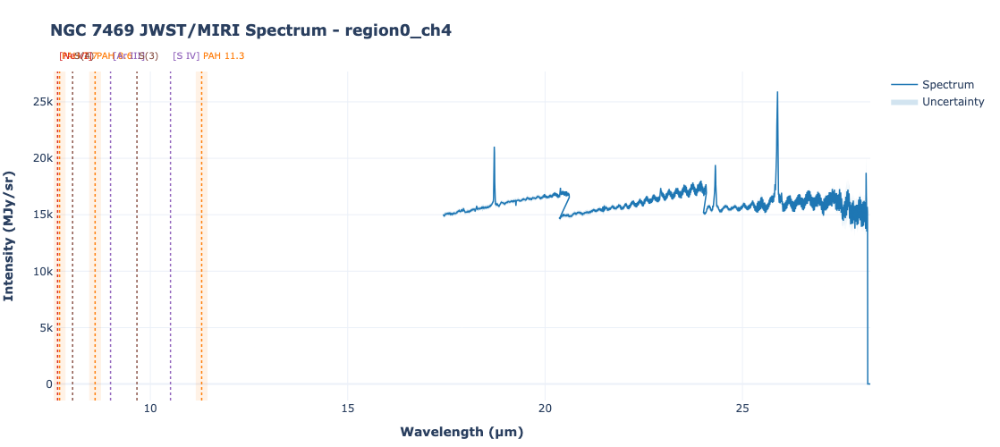

Set DATE-AVG to '2022-07-04T03:54:53.308' from MJD-AVG.
Set DATE-END to '2022-07-04T04:01:01.688' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.282938 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737445726.821 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:11:30.971' from MJD-AVG.
Set DATE-END to '2022-07-04T04:17:32.407' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283458 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737461174.508 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]
Set DATE-AVG to '2022-07-04T04:28:21.114' from MJD-AVG.
Set DATE-END to '2022-07-04T04:34:17.014' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -38.283980 from OBSGEO-[XYZ].
Set OBSGEO-H to 1737476710.042 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


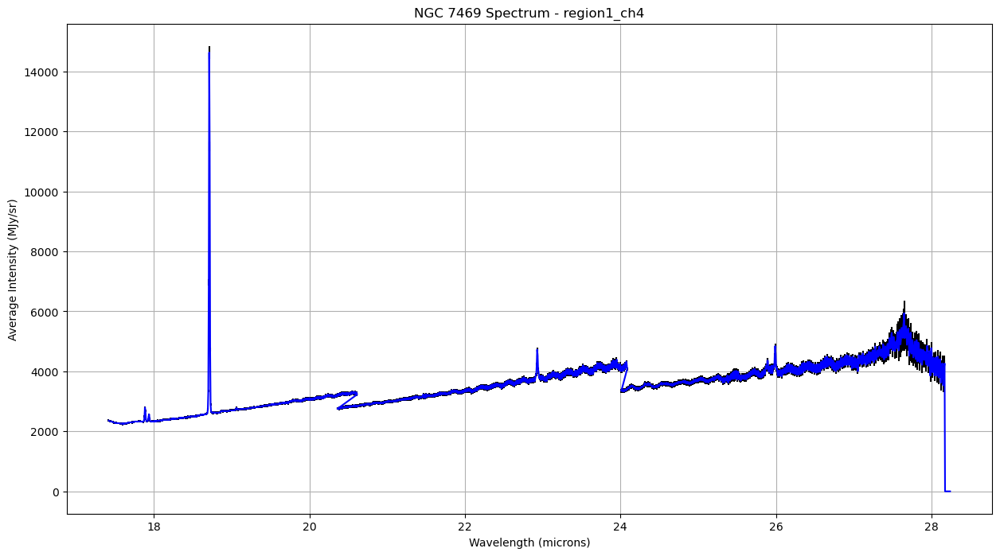

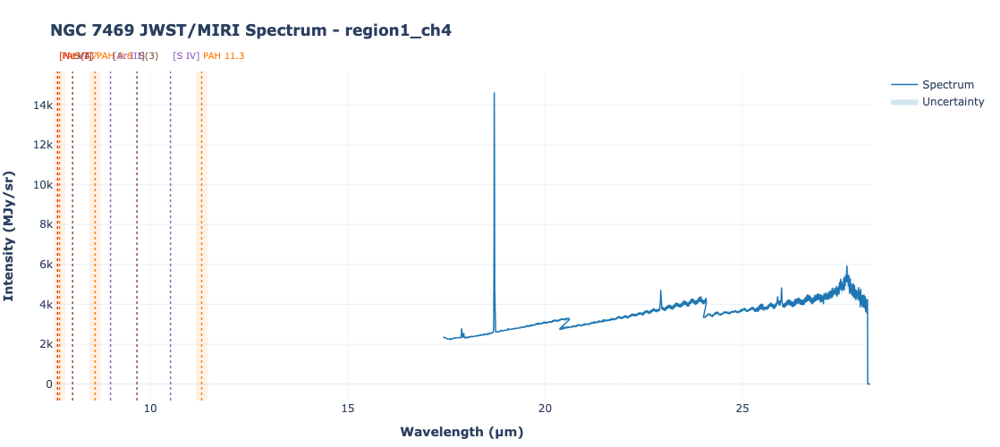

In [ ]:
for ch, files in channels.items():
    process_region(0, files, f'region0_{ch}')
    process_region(1, files, f'region1_{ch}')

 Run for All Channels Combined